In [2]:
import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
import cv2
import os
import sys
import glob
import urllib.request
import json

import networkx as nx
try:
  import osmnx as ox
except:
  # osmnx depends on the system package libspatialindex
  !apt install libspatialindex-dev
  !pip install osmnx
  import osmnx as ox

try: 
  import geopandas as gpd
except: 
  !pip install geopandas 
  import geopandas as gpd
  
try:
  import contextily as ctx 
except:
  # install dependencies for contextily
  !apt install libproj-dev proj-data proj-bin
  !apt install libgeos-dev
  !pip install cython
  !pip install cartopy
  # install contextily
  !pip install contextily==1.0rc1 --no-use-pep517 --no-cache-dir
  import contextily as ctx
  
import fiona
import fiona.crs
from shapely.geometry import Point, LineString, Polygon
from matplotlib import pyplot as plt
import numpy as np
import pandas as pd

In [3]:
file = pd.read_csv("http://ladi.s3-us-west-2.amazonaws.com/Labels/ladi_images_metadata.csv")
file

,uuid,timestamp,gps_lat,gps_lon,gps_alt,file_size,width,height,s3_path,url
0,a13fb353cca1f5e8060f95c80deb0c49e9a21f91,2016-01-16 07:34:55,29.623744,-95.652153,26.0,3497125.0,4608.0,3456.0,s3://ladi/Images/FEMA_CAP/1012/20118/VIRB0002_...,https://ladi.s3-us-west-2.amazonaws.com/Images...
1,03e5da2bc5e32cd7d58a164eefce499e2f14e06f,2014-06-24 13:09:20,32.386939,-86.344467,489.0,3518243.0,4608.0,3456.0,s3://ladi/Images/FEMA_CAP/1012/20118/VIRB0820_...,https://ladi.s3-us-west-2.amazonaws.com/Images...
2,c97e83122e14ec5fa5cfa6e2c911e066d8a07f7c,2014-06-24 11:06:27,NaN,NaN,NaN,8006650.0,6000.0,4000.0,s3://ladi/Images/FEMA_CAP/1012/20118/_DSC0015_...,https://ladi.s3-us-west-2.amazonaws.com/Images...
3,c534eb158948b63508eab34a667bf495e129f455,2014-06-24 11:20:03,NaN,NaN,NaN,8821238.0,6000.0,4000.0,s3://ladi/Images/FEMA_CAP/1012/20118/_DSC0123_...,https://ladi.s3-us-west-2.amazonaws.com/Images...
4,1c702459e21e5a7e7fec5eefaab42f5e5124113a,2014-06-24 11:21:07,32.371777,-86.345887,459.0,8385536.0,6000.0,4000.0,s3://ladi/Images/FEMA_CAP/1012/20118/_DSC0126_...,https://ladi.s3-us-west-2.amazonaws.com/Images...
...,...,...,...,...,...,...,...,...,...,...
580746,95fabbdbbb494beab517b5fea25a4e430d8fbcef,2020-01-27 12:01:31,18.002950,-66.896370,101.8,3413576.0,4000.0,3000.0,s3://ladi/Images/FEMA_CAP/9173/616637/2020_012...,https://ladi.s3-us-west-2.amazonaws.com/Images...
580747,4b590e5634dae396db6c838844d7670e5ef9e7f6,2020-01-27 12:00:25,18.003440,-66.896118,101.8,3307879.0,4000.0,3000.0,s3://ladi/Images/FEMA_CAP/9173/616637/2020_012...,https://ladi.s3-us-west-2.amazonaws.com/Images...
580748,bb7f86f1e9ab1a1ab3ea9e13cda998ab6e1bbb6d,2020-01-27 12:02:25,18.003280,-66.895955,101.8,3989427.0,4000.0,3000.0,s3://ladi/Images/FEMA_CAP/9173/616637/2020_012...,https://ladi.s3-us-west-2.amazonaws.com/Images...
580749,c9e5c19cb7cccf181d11b707f1a47b80341710b6,2020-01-27 12:00:45,18.003355,-66.896256,101.8,3722615.0,4000.0,3000.0,s3://ladi/Images/FEMA_CAP/9173/616637/2020_012...,https://ladi.s3-us-west-2.amazonaws.com/Images...


In [22]:
maas = file.loc[(file['gps_lat'] < 42.368520) & (file['gps_lat'] > 41.791453) & (file['gps_lon'] > -73.255974) &( file['gps_lon'] < - 69.998533)] 
maas.to_csv('massachusetts.csv') 

In [23]:
abbrev_maas = maas

In [24]:
for idx, url in enumerate(maas['url']):
    if idx<50:
        urllib.request.urlretrieve(url, 'mass/images/{}.jpg'.format(idx))

In [25]:
# Take initial guess of intrinsic parameters through metadata
!opensfm extract_metadata mass/

# Detect features points 
!opensfm detect_features mass/

# Match feature points across images
!opensfm match_features mass/

# This creates "tracks" for the features. That is to say, if a feature in image 1 is matched with one in image 2,
# and in turn that one is matched with one in image 3, then it links the matches between 1 and 3. In this case, 
# it does not matter since we only have two images
!opensfm create_tracks mass/

# Calculates the essential matrix, the camera pose and the reconstructed feature points
!opensfm reconstruct mass/

# For visualization using Open3D
!opensfm export_ply mass/

2020-07-30 03:50:09,872 INFO: Loading existing EXIF for 9.jpg
2020-07-30 03:50:09,872 INFO: Loading existing EXIF for 26.jpg
2020-07-30 03:50:09,872 INFO: Loading existing EXIF for 14.jpg
2020-07-30 03:50:09,872 INFO: Loading existing EXIF for 16.jpg
2020-07-30 03:50:09,872 INFO: Loading existing EXIF for 43.jpg
2020-07-30 03:50:09,873 INFO: Loading existing EXIF for 30.jpg
2020-07-30 03:50:09,873 INFO: Loading existing EXIF for 23.jpg
2020-07-30 03:50:09,873 INFO: Loading existing EXIF for 12.jpg
2020-07-30 03:50:09,873 INFO: Loading existing EXIF for 10.jpg
2020-07-30 03:50:09,873 INFO: Loading existing EXIF for 25.jpg
2020-07-30 03:50:09,873 INFO: Loading existing EXIF for 1.jpg
2020-07-30 03:50:09,873 INFO: Loading existing EXIF for 24.jpg
2020-07-30 03:50:09,874 INFO: Loading existing EXIF for 13.jpg
2020-07-30 03:50:09,874 INFO: Loading existing EXIF for 4.jpg
2020-07-30 03:50:09,874 INFO: Loading existing EXIF for 22.jpg
2020-07-30 03:50:09,874 INFO: Loading existing EXIF for 21

In [26]:
!opensfm undistort mass/

!opensfm compute_depthmaps mass/

2020-07-30 03:51:05,388 DEBUG: Undistorting the reconstruction
2020-07-30 03:51:05,486 DEBUG: Undistorting image 0.jpg
2020-07-30 03:51:10,271 DEBUG: Undistorting image 1.jpg
2020-07-30 03:51:15,037 DEBUG: Undistorting image 2.jpg
2020-07-30 03:51:19,668 DEBUG: Undistorting image 3.jpg
2020-07-30 03:51:24,285 DEBUG: Undistorting image 4.jpg
2020-07-30 03:51:28,900 DEBUG: Undistorting image 5.jpg
2020-07-30 03:51:33,481 DEBUG: Undistorting image 6.jpg
2020-07-30 03:51:38,111 DEBUG: Undistorting image 7.jpg
2020-07-30 03:51:44,545 INFO: Computing neighbors
2020-07-30 03:51:44,649 INFO: Using precomputed raw depthmap 0.jpg
2020-07-30 03:51:44,650 INFO: Using precomputed raw depthmap 1.jpg
2020-07-30 03:51:44,650 INFO: Using precomputed raw depthmap 2.jpg
2020-07-30 03:51:44,650 INFO: Using precomputed raw depthmap 3.jpg
2020-07-30 03:51:44,650 INFO: Using precomputed raw depthmap 4.jpg
2020-07-30 03:51:44,650 INFO: Computing depthmap for image 5.jpg with PATCH_MATCH_SAMPLE
2020-07-30 03:5

In [27]:
# Origin of our reconstruction, as given by the reference_lla.json (made from the reconstruction)
with open("mass/reference_lla.json", "r") as f:
    reference_lla = json.load(f)
    latitude=reference_lla["latitude"]
    longitude=reference_lla["longitude"]
    altitude=reference_lla["altitude"]

# This is the json file that contains the reconstructed feature points
with open("mass/reconstruction.json", "r") as f:
    reconstructions = json.load(f)

In [28]:
try:
    from pymap3d import enu2geodetic
except:
    !pip install pymap3d
    from pymap3d import enu2geodetic
from opensfm.features import denormalized_image_coordinates

# reading the csv
tracks = pd.read_csv("mass/tracks.csv", sep="\t", skiprows=1, names=["image_name", "track_id", "feature_id", "x", "y", "s", "R", "G", "B"])

# we need to denormalize the coordinates to turn them into regular pixel coordinates
normalized_coor = tracks[["x", "y", "s"]]
denormalized_coor = denormalized_image_coordinates(normalized_coor.values, 4496, 3000)

# create a new column with the denormalized coordinates
tracks["denorm_x"] = denormalized_coor[:, 0]
tracks["denorm_y"] = denormalized_coor[:, 1]

Processing /home/jovyan/.cache/pip/wheels/0c/24/19/30c440838faa979cd09d8ac37ae866669b980bfdaed4d0fb91/pymap3d-2.4.1-py3-none-any.whl


In [29]:
from shapely.geometry import Polygon
import geopandas as gpd

img_name_list = []
poly_list = []

for reconst in reconstructions:
    for shot in reconst["shots"]:
        # some housekeeping
        shot_name = shot.split(".")[0]
        img = cv2.imread("mass/images/"+shot) 
        h,w,_ = img.shape
        
        # here we get the features from the image and their corresponding reconstructed features
        reconst_ids = list(map(int, reconst["points"].keys()))
        tracks_shot = tracks[(tracks["image_name"] == shot) & (tracks["track_id"].isin(reconst_ids))]
        
        normalized_coor = tracks_shot[["x", "y", "s"]]
        denormalized_coor = denormalized_image_coordinates(normalized_coor.values, w, h)
        
        tracks_shot["denorm_x"] = denormalized_coor[:, 0]
        tracks_shot["denorm_y"] = denormalized_coor[:, 1]
        
        denorm_shot = np.round(tracks_shot[["denorm_x", "denorm_y"]].values)
        reconst_shot = np.array([reconst["points"][str(point)]["coordinates"] for point in tracks_shot["track_id"]])
        
        # transformation for the new orthorectified image
        H, inliers = cv2.findHomography(denorm_shot, reconst_shot[:, :2],cv2.RANSAC,5.0)
        
        
        pts = np.float32([ [0,0],[0,h-1],[w-1,h-1],[w-1,0] ]).reshape(-1,1,2)
        dst = cv2.perspectiveTransform(pts,H)[:,0,:]
        print(dst)
                
        geo_shot = np.array([enu2geodetic(dst[i, 0],dst[i, 1],0,longitude,latitude,altitude) for i in range(dst.shape[0])])  
        
        poly_points_list = geo_shot[:, :2].tolist()
        poly_points_tuples = tuple(map(tuple, poly_points_list))
        print(poly_points_tuples)
        
        img_name_list.append(shot_name)
        poly_list.append(Polygon(poly_points_tuples))

used_images = gpd.GeoDataFrame({'image_name':img_name_list, 'geometry':poly_list}, crs='EPSG:4326')
used_images

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:22: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


[[ 10107.498  -13497.005 ]
 [ 23148.275  -23864.283 ]
 [ 46255.09   -22461.314 ]
 [  9932.1875 -13914.789 ]]
((-70.87489090495214, 42.48421330740216), (-70.96692723718927, 42.84364887085516), (-70.95110013210859, 43.47728658127712), (-70.87864243752338, 42.479472126821435))
[[  9824.846  -13558.851 ]
 [ 22116.941  -18073.803 ]
 [  2749.9924 -14427.267 ]
 [  9927.298  -14067.36  ]]
((-70.87545658501392, 42.47649420972323), (-70.91512723416187, 42.813739272731574), (-70.88341965749657, 42.28311771924881), (-70.88001006969382, 42.479357096834946))
[[  9343.762  -13516.0625]
 [ 18079.38   -15562.582 ]
 [-24894.287  -20582.01  ]
 [  9665.158  -14130.705 ]]
((-70.87509172080671, 42.46333799396526), (-70.89294944652463, 42.70258762088117), (-70.93734140030155, 41.52523908801442), (-70.88058818163834, 42.47219694764629))
[[  9552.19  -13691.622]
 [  6736.305 -13600.292]
 [  8200.103 -14480.425]
 [  9742.389 -14035.254]]
((-70.87665723783944, 42.46905631121907), (-70.87593134083802, 42.39206642

,image_name,geometry
0,0,"POLYGON ((-70.87489 42.48421, -70.96693 42.843..."
1,1,"POLYGON ((-70.87546 42.47649, -70.91513 42.813..."
2,2,"POLYGON ((-70.87509 42.46334, -70.89295 42.702..."
3,3,"POLYGON ((-70.87666 42.46906, -70.87593 42.392..."
4,4,"POLYGON ((-70.87769 42.47116, -70.88014 42.418..."
5,5,"POLYGON ((-70.87885 42.47194, -70.88304 42.438..."
6,6,"POLYGON ((-70.87991 42.47486, -70.88579 42.450..."
7,7,"POLYGON ((-70.88065 42.47755, -70.88625 42.462..."
8,15,"POLYGON ((-70.87784 42.42330, -70.85181 42.545..."
9,16,"POLYGON ((-70.87762 42.42899, -70.85104 42.536..."


In [33]:
import pandas as pd
import numpy as np
from geopandas import GeoDataFrame
import geopandas
from shapely.geometry import LineString, Point
import matplotlib.pyplot as plt
import contextily as ctx

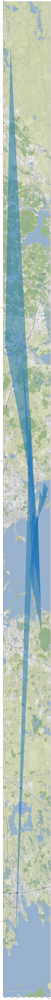

In [34]:
used_images = used_images.to_crs(epsg=3857)
ax = used_images.plot(figsize=(10, 250), alpha=0.5)
ctx.add_basemap(ax)

In [35]:
import open3d as o3d
from open3d import JVisualizer

pcd = o3d.io.read_point_cloud("mass/reconstruction.ply")
visualizer = JVisualizer()
visualizer.add_geometry(pcd)
visualizer.show()

JVisualizer with 1 geometries

In [36]:
l1=[]
import geopandas
#maas[maas.apply(lambda x: x.isnumeric())]
#maas.apply(l1.append([maas['gps_lat'], maas['gps_lon']]))
l1
gmaas = geopandas.GeoDataFrame( maas, geometry=geopandas.points_from_xy(maas.gps_lon, maas.gps_lat))
gmaas

,uuid,timestamp,gps_lat,gps_lon,gps_alt,file_size,width,height,s3_path,url,geometry
8291,58d6cb556e28ed809e02667c179f3cce6656faed,2018-03-04 16:27:46,42.080165,-70.622210,470.0,9082447.0,6000.0,4000.0,s3://ladi/Images/FEMA_CAP/9082/614359/DSC_1426...,https://ladi.s3-us-west-2.amazonaws.com/Images...,POINT (-70.62221 42.08017)
8292,bbd8403d8ae4b5c026f276416cdf24d3cc63c36b,2018-03-04 16:27:51,42.081870,-70.623698,478.0,9308484.0,6000.0,4000.0,s3://ladi/Images/FEMA_CAP/9082/614359/DSC_1427...,https://ladi.s3-us-west-2.amazonaws.com/Images...,POINT (-70.62370 42.08187)
8293,0df2e8ce8f3e5972f24f1244b2b03fd79ec6cd29,2018-03-04 16:27:53,42.082597,-70.624313,467.0,9312351.0,6000.0,4000.0,s3://ladi/Images/FEMA_CAP/9082/614359/DSC_1428...,https://ladi.s3-us-west-2.amazonaws.com/Images...,POINT (-70.62431 42.08260)
8294,6163c19e6a434cd5f5708b42f4632320b9cecccb,2018-03-04 16:27:57,42.084150,-70.625782,475.0,8589006.0,6000.0,4000.0,s3://ladi/Images/FEMA_CAP/9082/614359/DSC_1429...,https://ladi.s3-us-west-2.amazonaws.com/Images...,POINT (-70.62578 42.08415)
8295,2c5585f4703d819cc2978816b34d962cae7baac5,2018-03-04 16:27:59,42.084782,-70.626448,467.0,9098233.0,6000.0,4000.0,s3://ladi/Images/FEMA_CAP/9082/614359/DSC_1430...,https://ladi.s3-us-west-2.amazonaws.com/Images...,POINT (-70.62645 42.08478)
...,...,...,...,...,...,...,...,...,...,...,...
573070,7d3184c736ec2b7703d27005474c2d2d515b4ef4,2019-11-23 15:17:16,41.947585,-72.620515,194.0,1703608.0,4496.0,3000.0,s3://ladi/Images/FEMA_CAP/5/616524/RRTask22_2d...,https://ladi.s3-us-west-2.amazonaws.com/Images...,POINT (-72.62051 41.94758)
573071,6c9b03cf1018b318bc17e5f169b737da116fce9f,2019-11-23 15:16:15,41.952013,-72.644547,219.0,1668936.0,4496.0,3000.0,s3://ladi/Images/FEMA_CAP/5/616524/RRTask22_3a...,https://ladi.s3-us-west-2.amazonaws.com/Images...,POINT (-72.64455 41.95201)
573072,588f4f1d6072539ada45d73c9c74bbf8b72e20d2,2019-11-23 15:15:08,41.940983,-72.670312,232.0,1648900.0,4496.0,3000.0,s3://ladi/Images/FEMA_CAP/5/616524/RRTask22_85...,https://ladi.s3-us-west-2.amazonaws.com/Images...,POINT (-72.67031 41.94098)
573073,3b3e4ff818d0783fcb6859124ff4cbdc6831c3d6,2019-11-23 15:17:10,41.949347,-72.622558,187.0,1699969.0,4496.0,3000.0,s3://ladi/Images/FEMA_CAP/5/616524/RRTask22_94...,https://ladi.s3-us-west-2.amazonaws.com/Images...,POINT (-72.62256 41.94935)


In [5]:
gdf = gpd.GeoDataFrame(abbrev_maas, geometry=gpd.points_from_xy(abbrev_maas.gps_lon, abbrev_maas.gps_lat))
gdf

,uuid,timestamp,gps_lat,gps_lon,gps_alt,file_size,width,height,s3_path,url,geometry
8291,58d6cb556e28ed809e02667c179f3cce6656faed,2018-03-04 16:27:46,42.080165,-70.622210,470.0,9082447.0,6000.0,4000.0,s3://ladi/Images/FEMA_CAP/9082/614359/DSC_1426...,https://ladi.s3-us-west-2.amazonaws.com/Images...,POINT (-70.62221 42.08017)
8292,bbd8403d8ae4b5c026f276416cdf24d3cc63c36b,2018-03-04 16:27:51,42.081870,-70.623698,478.0,9308484.0,6000.0,4000.0,s3://ladi/Images/FEMA_CAP/9082/614359/DSC_1427...,https://ladi.s3-us-west-2.amazonaws.com/Images...,POINT (-70.62370 42.08187)
8293,0df2e8ce8f3e5972f24f1244b2b03fd79ec6cd29,2018-03-04 16:27:53,42.082597,-70.624313,467.0,9312351.0,6000.0,4000.0,s3://ladi/Images/FEMA_CAP/9082/614359/DSC_1428...,https://ladi.s3-us-west-2.amazonaws.com/Images...,POINT (-70.62431 42.08260)
8294,6163c19e6a434cd5f5708b42f4632320b9cecccb,2018-03-04 16:27:57,42.084150,-70.625782,475.0,8589006.0,6000.0,4000.0,s3://ladi/Images/FEMA_CAP/9082/614359/DSC_1429...,https://ladi.s3-us-west-2.amazonaws.com/Images...,POINT (-70.62578 42.08415)
8295,2c5585f4703d819cc2978816b34d962cae7baac5,2018-03-04 16:27:59,42.084782,-70.626448,467.0,9098233.0,6000.0,4000.0,s3://ladi/Images/FEMA_CAP/9082/614359/DSC_1430...,https://ladi.s3-us-west-2.amazonaws.com/Images...,POINT (-70.62645 42.08478)
...,...,...,...,...,...,...,...,...,...,...,...
573070,7d3184c736ec2b7703d27005474c2d2d515b4ef4,2019-11-23 15:17:16,41.947585,-72.620515,194.0,1703608.0,4496.0,3000.0,s3://ladi/Images/FEMA_CAP/5/616524/RRTask22_2d...,https://ladi.s3-us-west-2.amazonaws.com/Images...,POINT (-72.62051 41.94758)
573071,6c9b03cf1018b318bc17e5f169b737da116fce9f,2019-11-23 15:16:15,41.952013,-72.644547,219.0,1668936.0,4496.0,3000.0,s3://ladi/Images/FEMA_CAP/5/616524/RRTask22_3a...,https://ladi.s3-us-west-2.amazonaws.com/Images...,POINT (-72.64455 41.95201)
573072,588f4f1d6072539ada45d73c9c74bbf8b72e20d2,2019-11-23 15:15:08,41.940983,-72.670312,232.0,1648900.0,4496.0,3000.0,s3://ladi/Images/FEMA_CAP/5/616524/RRTask22_85...,https://ladi.s3-us-west-2.amazonaws.com/Images...,POINT (-72.67031 41.94098)
573073,3b3e4ff818d0783fcb6859124ff4cbdc6831c3d6,2019-11-23 15:17:10,41.949347,-72.622558,187.0,1699969.0,4496.0,3000.0,s3://ladi/Images/FEMA_CAP/5/616524/RRTask22_94...,https://ladi.s3-us-west-2.amazonaws.com/Images...,POINT (-72.62256 41.94935)


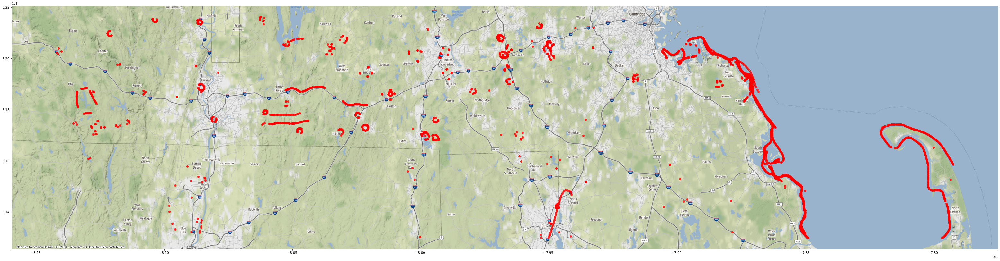

In [7]:
gdf.crs = {'init' :'epsg:4326'}
ax = gdf.to_crs(epsg=3857).plot(figsize=(55, 350), alpha=.8, color='red')
ctx.add_basemap(ax)

In [8]:
gd1 = ox.pois.pois_from_place('MA, USA', tags={"amenity": "hospital"})
gd1

/opt/conda/lib/python3.7/site-packages/osmnx/pois.py:370: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  gdf = gdf.loc[gdf["geometry"].centroid.within(polygon)]


,osmid,geometry,attribution,highway,source,element_type,created_by,stop,addr:city,addr:housenumber,...,alt_name,gnis:county_name,gnis:import_uuid,gnis:reviewed,operator:type,urgent_care,disused:amenity,official_name,fee,parking
61344227,61344227,POINT (-71.10514 42.33778),Office of Geographic and Environmental Informa...,traffic_signals,massgis_import_v0.1_20071008193615,node,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
61389417,61389417,POINT (-71.10354 42.34003),Office of Geographic and Environmental Informa...,NaN,massgis_import_v0.1_20071008193615,node,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
61389421,61389421,POINT (-71.10339 42.33995),Office of Geographic and Environmental Informa...,NaN,massgis_import_v0.1_20071008193615,node,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
61389428,61389428,POINT (-71.10358 42.34006),Office of Geographic and Environmental Informa...,NaN,massgis_import_v0.1_20071008193615,node,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
61427560,61427560,POINT (-71.17051 42.27573),Office of Geographic and Environmental Informa...,NaN,massgis_import_v0.1_20071008193615,node,JOSM,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
822922630,822922630,"POLYGON ((-71.14654 42.35001, -71.14698 42.348...",NaN,NaN,NaN,way,NaN,NaN,Brighton,736,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
824246773,824246773,"POLYGON ((-71.26431 42.39518, -71.26377 42.397...",NaN,NaN,NaN,way,NaN,NaN,Waltham,52,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
830564444,830564444,"POLYGON ((-71.07426 42.33401, -71.07397 42.333...",NaN,NaN,NaN,way,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
830564449,830564449,"POLYGON ((-71.07440 42.33454, -71.07434 42.334...",NaN,NaN,NaN,way,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [17]:
from shapely.geometry import MultiPoint, MultiLineString, MultiPolygon, box
poly_gdf = gpd.GeoDataFrame()
new_gdf = gpd.GeoDataFrame()
for index, row in gdf.iterrows():
    new_poly = row['geometry'].buffer(.1)
#     temp_gdf = ox.pois.pois_from_polygon(new_poly, tags = {'aeroway': True, 'building': 'yes'})
    temp_gdf = ox.pois.pois_from_polygon(new_poly, tags = {'amenity': True})
    new_gdf = new_gdf.append(temp_gdf)
#     poly_gdf = poly_gdf.append(new_poly)
#     print(temp_gdf)
    


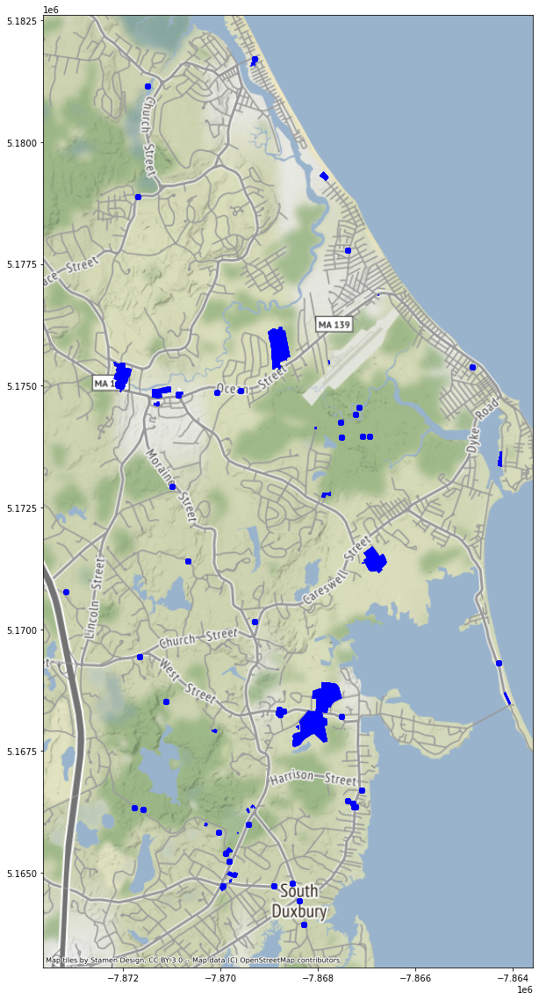

In [19]:
# gdf = gdf.head(10)
# gdf.crs = {'init' :'epsg:4326'}
# roads = ox.graph.graph_from_bbox(gdf['gps_lat'].max(), gdf['gps_lat'].min(), gdf['gps_lon'].max(), gdf['gps_lon'].min())
ax = new_gdf.to_crs(epsg=3857).plot(figsize=(10, 350), alpha=.8, color='blue')
# gdf.to_crs(epsg=3857).plot(figsize=(10, 350), alpha=.8, color="blue", ax=ax)
ctx.add_basemap(ax)

/opt/conda/lib/python3.7/site-packages/pyproj/crs/crs.py:53: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  return _prepare_from_string(" ".join(pjargs))
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:2: FutureWarning: CRS mismatch between CRS of the passed geometries and 'crs'. Use 'GeoDataFrame.set_crs(crs, allow_override=True)' to overwrite CRS or 'GeoDataFrame.to_crs(crs)' to reproject geometries. CRS mismatch will raise an error in the future versions of GeoPandas.
  


/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:3: FutureWarning: The "url" option is deprecated. Please use the "source" argument instead.
  This is separate from the ipykernel package so we can avoid doing imports until
/opt/conda/lib/python3.7/site-packages/contextily/tile.py:268: FutureWarning: The url format using 'tileX', 'tileY', 'tileZ' as placeholders is deprecated. Please use '{x}', '{y}', '{z}' instead.
  FutureWarning,


UnidentifiedImageError: cannot identify image file <_io.BytesIO object at 0x7f1cf53f2950>

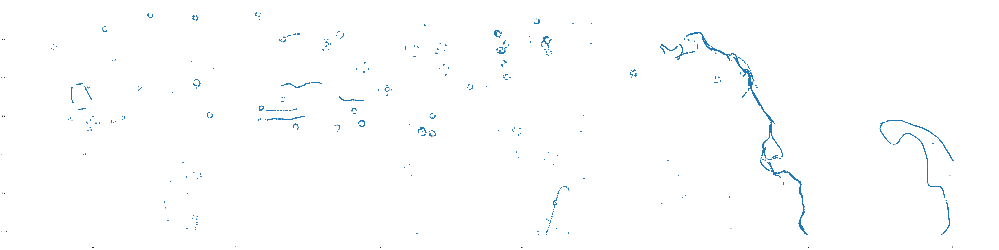

In [43]:
ax5 = gdf.plot(figsize=(100, 250))
# choose any of the supported maps from ctx.sources
ctx.add_basemap(ax5, url='http://tile.stamen.com/watercolor/tileZ/tileX/tileY.png')
ax.set_axis_off()
plt.show()

In [44]:
try:
  import rasterio
  import rasterio.plot
except:
  !pip install rasterio
  import rasterio
  import rasterio.plot

In [45]:
filepath = pd.read_csv("denver_dems.csv")
filepath

,sourceId,extent,sourceOriginName,boundingBox,sizeInBytes,bestFitIndex,format,downloadURL,previewGraphicURL,prettyFileSize,datasets,title,sourceOriginId,lastUpdated,dateCreated,metaUrl,sourceName,publicationDate
0,5deb3285e4b02caea0f0e9f1,1 x 1 degree,gda,"{minY:36.9993520146,minX:-106.000556022,maxY:3...",369438874,0.025057,GeoTIFF,https://prd-tnm.s3.amazonaws.com/StagedProduct...,https://prd-tnm.s3.amazonaws.com/StagedProduct...,352.32 MB,[National Elevation Dataset (NED) 1/3 arc-seco...,USGS 13 arc-second n38w106 1 x 1 degree,14429415,2020-03-03,2019-12-06,https://www.sciencebase.gov/catalog/item/5deb3...,ScienceBase,2019-06-21
1,5deb3281e4b02caea0f0e9ed,1 x 1 degree,gda,"{minY:36.99944444444,minX:-104.0005555556,maxY...",360458913,0.025053,GeoTIFF,https://prd-tnm.s3.amazonaws.com/StagedProduct...,https://prd-tnm.s3.amazonaws.com/StagedProduct...,343.76 MB,[National Elevation Dataset (NED) 1/3 arc-seco...,USGS 13 arc-second n38w104 1 x 1 degree,14429123,2020-03-03,2019-12-06,https://www.sciencebase.gov/catalog/item/5deb3...,ScienceBase,2013-01-01
2,5deb3295e4b02caea0f0ea59,1 x 1 degree,gda,"{minY:37.99944444444,minX:-108.0005555556,maxY...",408113052,0.025053,GeoTIFF,https://prd-tnm.s3.amazonaws.com/StagedProduct...,https://prd-tnm.s3.amazonaws.com/StagedProduct...,389.21 MB,[National Elevation Dataset (NED) 1/3 arc-seco...,USGS 13 arc-second n39w108 1 x 1 degree,14429709,2020-03-03,2019-12-06,https://www.sciencebase.gov/catalog/item/5deb3...,ScienceBase,2013-01-01
3,5deb3281e4b02caea0f0e9ef,1 x 1 degree,gda,"{minY:36.99944444444,minX:-105.0005555556,maxY...",367232018,0.025053,GeoTIFF,https://prd-tnm.s3.amazonaws.com/StagedProduct...,https://prd-tnm.s3.amazonaws.com/StagedProduct...,350.22 MB,[National Elevation Dataset (NED) 1/3 arc-seco...,USGS 13 arc-second n38w105 1 x 1 degree,14429279,2020-03-03,2019-12-06,https://www.sciencebase.gov/catalog/item/5deb3...,ScienceBase,2013-01-01
4,5deb32a4e4b02caea0f0eab5,1 x 1 degree,gda,"{minY:38.99944444444,minX:-104.0005555556,maxY...",338867282,0.025053,GeoTIFF,https://prd-tnm.s3.amazonaws.com/StagedProduct...,https://prd-tnm.s3.amazonaws.com/StagedProduct...,323.17 MB,[National Elevation Dataset (NED) 1/3 arc-seco...,USGS 13 arc-second n40w104 1 x 1 degree,14429657,2020-03-03,2019-12-06,https://www.sciencebase.gov/catalog/item/5deb3...,ScienceBase,2013-01-01
5,5deb3294e4b02caea0f0ea51,1 x 1 degree,gda,"{minY:37.99944444444,minX:-104.0005555556,maxY...",305368721,0.025053,GeoTIFF,https://prd-tnm.s3.amazonaws.com/StagedProduct...,https://prd-tnm.s3.amazonaws.com/StagedProduct...,291.22 MB,[National Elevation Dataset (NED) 1/3 arc-seco...,USGS 13 arc-second n39w104 1 x 1 degree,14429145,2020-03-03,2019-12-06,https://www.sciencebase.gov/catalog/item/5deb3...,ScienceBase,2013-01-01
6,5deb32b5e4b02caea0f0eb29,1 x 1 degree,gda,"{minY:39.99944444444,minX:-109.0005555556,maxY...",410834570,0.025053,GeoTIFF,https://prd-tnm.s3.amazonaws.com/StagedProduct...,https://prd-tnm.s3.amazonaws.com/StagedProduct...,391.80 MB,[National Elevation Dataset (NED) 1/3 arc-seco...,USGS 13 arc-second n41w109 1 x 1 degree,14429400,2020-03-03,2019-12-06,https://www.sciencebase.gov/catalog/item/5deb3...,ScienceBase,2013-01-01
7,5deb3294e4b02caea0f0ea53,1 x 1 degree,gda,"{minY:37.99944444444,minX:-105.0005555556,maxY...",345827999,0.025053,GeoTIFF,https://prd-tnm.s3.amazonaws.com/StagedProduct...,https://prd-tnm.s3.amazonaws.com/StagedProduct...,329.81 MB,[National Elevation Dataset (NED) 1/3 arc-seco...,USGS 13 arc-second n39w105 1 x 1 degree,14429306,2020-03-03,2019-12-06,https://www.sciencebase.gov/catalog/item/5deb3...,ScienceBase,2013-01-01
8,5deb3295e4b02caea0f0ea57,1 x 1 degree,gda,"{minY:37.99944444444,minX:-107.0005555556,maxY...",401700317,0.025053,GeoTIFF,https://prd-tnm.s3.amazonaws.com/StagedProduct...,https://prd-tnm.s3.amazonaws.com/StagedProduct...,383.09 MB,[National Elevation Dataset (NED) 1/3 arc-seco...,USGS 13 arc-second n39w107 1 x 1 degree,14429583,2020-03-03,2019-12-06,https://www.scienc

In [48]:
for idx, url in enumerate(filepath['downloadURL']):
    if idx<10:
        urllib.request.urlretrieve(url, 'denver/{}.tif'.format(idx))

In [49]:
!/opt/conda/bin/gdaldem hillshade denver/0.tif denver/0_hs.tif

0...10...20...30...40...50...60...70...80...90...100 - done.


In [50]:
img=img.imread('0_hs.tif ')
imgplot = plt.imshow(img)
#imgplot2 = plt.imshow(band3Array)
plt.show()

AttributeError: 'numpy.ndarray' object has no attribute 'imread'

In [ ]:
with rasterio.open('denver/0_hs.tif', 'r') as src:
    print(src.meta)
    hillshade = src.read(1)
    hillshade_mask = src.read_masks(1)
    hillshade_transform = src.profile['transform']
    
    fig, ax = plt.subplots(1,figsize = (10,10))
    
    rasterio.plot.show(np.ma.masked_where(hillshade_mask==0, hillshade), transform=hillshade_transform, ax=ax)
   
    plt.show()
    

{'driver': 'GTiff', 'dtype': 'uint8', 'nodata': 0.0, 'width': 10812, 'height': 10812, 'count': 1, 'crs': CRS.from_epsg(4269), 'transform': Affine(9.2592593e-05, 0.0, -106.000555555558,
       0.0, -9.2592593e-05, 38.000555555558)}


In [ ]:
fig1= plt.figure()

ax5 = gdf.plot(figsize=(100, 250))
ax8 = fig1.add_subplot()
# choose any of the supported maps from ctx.sources
ctx.add_basemap(ax5, url='http://tile.stamen.com/watercolor/tileZ/tileX/tileY.png%27)
new_gdf.to_crs(epsg=3857).plot(figsize=(10, 350), alpha=.8, color='blue', ax=ax5)

ax.set_axis_off()
plt.show()